In [132]:
# import Update_Database_Data

# pictures_df  = Update_Database_Data.get_outfit_pictures()

# pictures_df.head()
# outfits_df = Update_Database_Data.get_tagged_outfits()
# outfits_df.head(2)
# OUTFITS_QUERY = "SELECT `Outfits`.`id` AS `id`, `Outfits`.`owner` AS `owner`, `Outfits`.`name` AS `name`, `Outfits`.`description` AS `description`, `Outfits`.`brand` AS `brand`, `Outfits`.`isPublic` AS `isPublic`, `Outfits`.`isDeleted` AS `isDeleted`, `Outfits`.`timeCreated` AS `timeCreated`, `Outfits`.`timeUpdated` AS `timeUpdated`, `Outfits`.`pricePerWeek` AS `pricePerWeek`, `Outfits`.`pricePerMonth` AS `pricePerMonth`, `Outfits`.`type` AS `type`, `Outfits`.`keywords` AS `keywords`, `Outfits`.`retailPrice` AS `retailPrice`, `Outfits`.`meta.validFrom` AS `meta.validFrom`, `Outfits`.`meta.validTo` AS `meta.validTo` FROM `Outfits` WHERE (`Outfits`.`isPublic` = TRUE AND `Outfits`.`isDeleted` = FALSE AND `Outfits`.`meta.validTo` >= '9999-01-01 00:00:00')"

# db_outfits = Update_Database_Data.get_db_query(OUTFITS_QUERY)[["id", "description"]]
# outfits_df = outfits_df.merge(db_outfits, on="id", how="left")
# outfits_df.head(2)

# # import os

# # MIN_FILE_SIZE = 1000

# # def check_if_file_valid(file_path):
# #     return os.path.exists(file_path) and os.path.getsize(file_path) > MIN_FILE_SIZE

# # pictures_path = "/home/kaborg15/FREja/Pickled_Data/Embeddings_CLIP/pictures/"
# # pictures_df["valid"] = pictures_df["id"].apply(lambda x: check_if_file_valid(os.path.join(pictures_path, x)))
# # print("Number of valid pictures: ", pictures_df["valid"].sum(), " invalid: ", (~pictures_df["valid"]).sum())
# # pictures_df = pictures_df[pictures_df["valid"]]
# # pictures_df.drop(columns=["valid"], inplace=True)
# # pictures_df.head(2)

In [133]:
import os
%load_ext autoreload
%autoreload 2
%reload_ext autoreload


os.chdir("/home/kaborg15/FREja_Search/")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [134]:
from Load_Fashion_CLIP_Catalog_Data import load_image_embeddings

fclip_image_vectors, fclip_text_vectors, catalog, pictures_df, outfits_df, orders_df, fclip = load_image_embeddings(load_cataloge=True)

ead6cba5fe7ab8c333b5a3ae4d420f253deab0f9_73e482ef33abfb9f2dd4fc95891e7440ed57267aa678f21e717c8e19765d6db6
dict_keys(['9d8b31fd16d4edb8c7333a9e6048c5f3623ef9d7_bbfef9bacf66edb469374292a2b5246404ccd6215be175f7fd870a6a48e015a6', '9d8b31fd16d4edb8c7333a9e6048c5f3623ef9d7_7384e92be08ab216b5dfae372d47b1261a99d6dbe481904bc64c6a8396bd5dcd', '9d8b31fd16d4edb8c7333a9e6048c5f3623ef9d7_0146843e927994c24f8320c41bc155100c3624b2cd7fcc914b883ac9483f3d4f', 'ead6cba5fe7ab8c333b5a3ae4d420f253deab0f9_fee8adfde65c4ffdfeed7aa44945f18f5892c2b556a1c51f2eb257a94267d14b', 'ead6cba5fe7ab8c333b5a3ae4d420f253deab0f9_73e482ef33abfb9f2dd4fc95891e7440ed57267aa678f21e717c8e19765d6db6'])
Loading local vector hashes...
Normalizing Input Vectors...Done!
Building Approx NN index...Done!


In [135]:
def merge_in_outfit_columns(outfit_df, pictures_df, column_names):
    outfit_df_subset = outfit_df[["id"] + column_names]
    outfit_df_subset.columns = ["owner"] + column_names
    pictures_df = pictures_df.merge(outfit_df_subset, on="owner", how="left")
    return pictures_df

pictures_df["image_embedding"] = list(fclip_image_vectors)
pictures_df["text_embedding"] = list(fclip_text_vectors)
pictures_df = pictures_df.drop(columns=["keep_row"], errors="ignore")
pictures_df = merge_in_outfit_columns(outfits_df, pictures_df, ["name", "description", "outfit_tags",	"tag_categories",	"Outfit_size",	"tag_encoding",	"description"])
pictures_df

,id,owner,contentType,status,displayOrder,sourceURL,description_x,attribution,timeCreated,timeUpdated,meta.validFrom,meta.validTo,image_embedding,text_embedding,name,description_y,outfit_tags,tag_categories,Outfit_size,tag_encoding,description_y
0,picture.0000cdba64314d84a49ed1c266589cc0,outfit.794483397da8425a813301eecf9828c6,image/jpeg,ACTIVE,0,None,None,None,2019-09-07 09:52:32.000,2019-09-07 09:52:47.000,2019-09-07 09:52:39.831,9999-01-01 00:00:00,"[-0.024287453, 0.03701493, -0.02844217, 0.0927...","[-0.05313541, 0.025319584, -0.018410295, 0.086...",Limon Wrap Niagara Dress,This midi length dress with an adjustable wais...,"[Viscose, Multi Season, Midi, Everyday, Samsøe...","[Material, Seasons, Length, Occasion, Brand, F...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",This midi length dress with an adjustable wais...
1,picture.00058abb53434872ae9bb4270ae21f8e,outfit.98f32aaf08bc4ff09c44e6e11e9199bc,image/jpeg,ACTIVE,2,https://cdn.shopify.com/s/files/1/0424/9927/69...,None,,2021-05-25 13:52:25.296,2021-05-25 13:52:55.169,2021-05-25 13:52:55.169,9999-01-01 00:00:00,"[-0.0040395684, 0.1221746, -0.049363144, 0.022...","[-0.002178842, 0.016401345, -0.06984836, 0.065...",Kim Bright White Dress,The KIM is an oversized menswear inspired shir...,"[Cotton, Midi, Everyday, Dresses, XS, Summer, ...","[Material, Length, Occasion, Category, Size, S...",[XS],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The KIM is an oversized menswear inspired shir...
2,picture.00063f52c36d43ada95da45f819b30b4,outfit.9fd1c42c3db543c5b6e53b0db1ee8c0f,image/jpeg,ACTIVE,3,https://storage.googleapis.com/batch-uploads-p...,None,,2022-12-16 10:05:40.314,2022-12-16 10:05:52.232,2022-12-16 10:05:52.232,9999-01-01 00:00:00,"[-0.0127086695, 0.0592464, -0.05856385, -0.006...","[0.0011028233, 0.01954076, 0.016044276, -0.035...",Lace Dress,The Lace Dress from Karen Millen is a elegante...,"[Dressed-up, Synthetic, Midi, Everyday, M, Dre...","[Occasion, Material, Length, Occasion, Size, C...",[M],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The Lace Dress from Karen Millen is a elegante...
3,picture.0008443461814f5c988f123718bbd20e,outfit.a7539783b6e94591bdf4e10339afc1d7,image/jpeg,ACTIVE,3,https://storage.googleapis.com/batch-uploads-p...,None,,2023-02-14 06:31:01.455,2023-02-14 06:31:38.873,2023-02-14 06:31:38.873,9999-01-01 00:00:00,"[-0.017948486, 0.059368093, -0.10794367, 0.075...","[0.0003785785, 0.034153514, 0.033039812, 0.048...",Oversize Shirt Dress Green,A long shirt with collar in organic crispy cot...,"[Høst & Vår, Cotton, Multi Season, Everyday, D...","[Brand, Material, Seasons, Occasion, Category,...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",A long shirt with collar in organic crispy cot...
4,picture.000cf715019a4a02aaf0dc479212195a,outfit.f11bdc25d87946f8b831b608bc8fb574,image/jpeg,ACTIVE,1,https://storage.googleapis.com/batch-uploads-p...,None,,2022-09-14 16:26:52.893,2022-09-14 16:27:37.847,2022-09-14 16:27:37.847,9999-01-01 00:00:00,"[0.016645785, 0.07629911, 0.003135107, 0.06165...","[-0.004993015, 0.029407833, 0.034829285, 0.112...",Conscious Blouse,The Conscious Blouse from Filippa K is a silk ...,"[Silk, Blouses, Everyday, Summer, Filippa K, S...","[Material, Category, Occasion, Seasons, Brand,...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The Conscious Blouse from Filippa K is a silk ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32098,picture.fff5bb0db4e84bb881a023a1ca0a9765,outfit.75ecab77310b458cbcbe78b536da020e,image/jpeg,ACTIVE,2,https://storage.googleapis.com/batch-uploads-p...,None,,2022-10-11 09:53:05.411,2022-10-11 09:54:25.122,2022-10-11 09:54:25.122,9999-01-01 00:00:00,"[0.007837592, 0.072420694, -0.042799246, 0.008...","[0.020998593, 0.0116376085, 0.051809814, 0.013...",Katrina Midi Dress,The Katrina Midi Dress from Soft Rebels is a c...,"[Dressed-up, Viscose, Midi, Everyday, Dresses,...","[Occasion, Material, Length, Occasion, Categor.

In [136]:
DROP_COLUMNS = ["description_x", "contentType",	"status",	"displayOrder", "sourceURL",	"description_x",	"attribution", 	"timeCreated",	"timeUpdated", "meta.validFrom",	"meta.validTo"]
pictures_df.drop(columns=DROP_COLUMNS, inplace=True, errors="ignore")
pictures_df.rename(columns={"description_y": "description"}, inplace=True)
pictures_df.head(2)

,id,owner,image_embedding,text_embedding,name,description,outfit_tags,tag_categories,Outfit_size,tag_encoding,description
0,picture.0000cdba64314d84a49ed1c266589cc0,outfit.794483397da8425a813301eecf9828c6,"[-0.024287453, 0.03701493, -0.02844217, 0.0927...","[-0.05313541, 0.025319584, -0.018410295, 0.086...",Limon Wrap Niagara Dress,This midi length dress with an adjustable wais...,"[Viscose, Multi Season, Midi, Everyday, Samsøe...","[Material, Seasons, Length, Occasion, Brand, F...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",This midi length dress with an adjustable wais...
1,picture.00058abb53434872ae9bb4270ae21f8e,outfit.98f32aaf08bc4ff09c44e6e11e9199bc,"[-0.0040395684, 0.1221746, -0.049363144, 0.022...","[-0.002178842, 0.016401345, -0.06984836, 0.065...",Kim Bright White Dress,The KIM is an oversized menswear inspired shir...,"[Cotton, Midi, Everyday, Dresses, XS, Summer, ...","[Material, Length, Occasion, Category, Size, S...",[XS],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The KIM is an oversized menswear inspired shir...


In [137]:
import numpy as np

def find_tag_in_category(category_name, outfit_row):
    tags, tag_categories = outfit_row["outfit_tags"], outfit_row["tag_categories"]
    if category_name not in tag_categories:
        return None
    tag_index = np.where(tag_categories == category_name)[0][0]
    return tags[tag_index]

embeddings_df = pictures_df.copy()
embeddings_df['hash'] = embeddings_df['image_embedding'].apply(lambda x: hash(x.tobytes()))
#embeddings_df = embeddings_df.drop_duplicates(subset=['hash'])
embeddings_df["material"] = embeddings_df.apply(lambda x: find_tag_in_category("Material", x), axis=1)
embeddings_df["category"] = embeddings_df.apply(lambda x: find_tag_in_category("Category", x), axis=1)
embeddings_df.head(2)

,id,owner,image_embedding,text_embedding,name,description,outfit_tags,tag_categories,Outfit_size,tag_encoding,description,hash,material,category
0,picture.0000cdba64314d84a49ed1c266589cc0,outfit.794483397da8425a813301eecf9828c6,"[-0.024287453, 0.03701493, -0.02844217, 0.0927...","[-0.05313541, 0.025319584, -0.018410295, 0.086...",Limon Wrap Niagara Dress,This midi length dress with an adjustable wais...,"[Viscose, Multi Season, Midi, Everyday, Samsøe...","[Material, Seasons, Length, Occasion, Brand, F...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",This midi length dress with an adjustable wais...,4407879948980236932,Viscose,Dresses
1,picture.00058abb53434872ae9bb4270ae21f8e,outfit.98f32aaf08bc4ff09c44e6e11e9199bc,"[-0.0040395684, 0.1221746, -0.049363144, 0.022...","[-0.002178842, 0.016401345, -0.06984836, 0.065...",Kim Bright White Dress,The KIM is an oversized menswear inspired shir...,"[Cotton, Midi, Everyday, Dresses, XS, Summer, ...","[Material, Length, Occasion, Category, Size, S...",[XS],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The KIM is an oversized menswear inspired shir...,-2476823619172038015,Cotton,Dresses


In [138]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def get_silhouette_score(data, n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=0).fit(data)
    return silhouette_score(data, kmeans.labels_)


Cluster 2, sum: 14.543099403381348
Showing 27 images of 706:


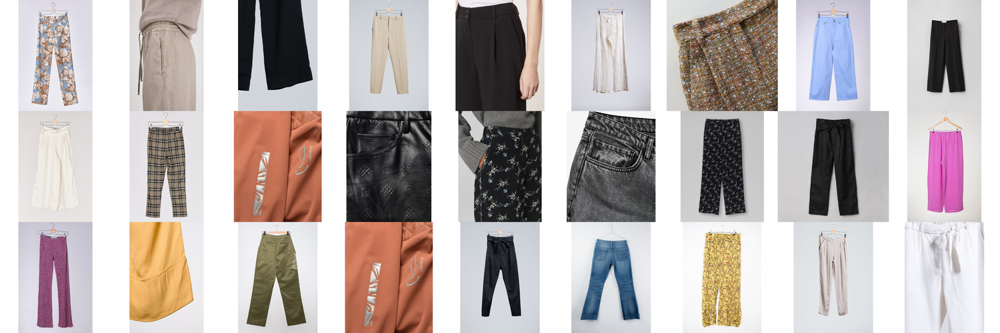

Cluster 3, sum: 11.26419734954834
Showing 27 images of 537:


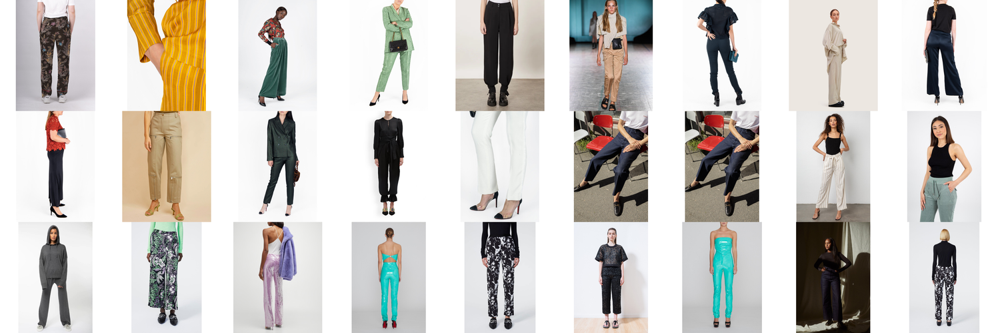

Cluster 0, sum: 10.353044509887695
Showing 27 images of 481:


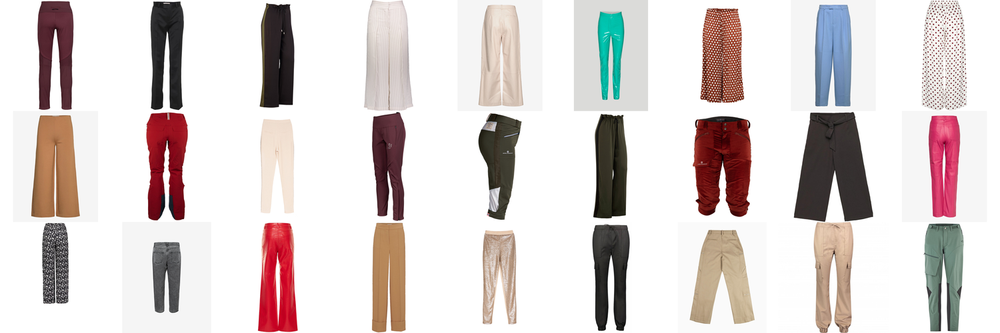

Cluster 1, sum: 7.484450817108154
Showing 27 images of 290:


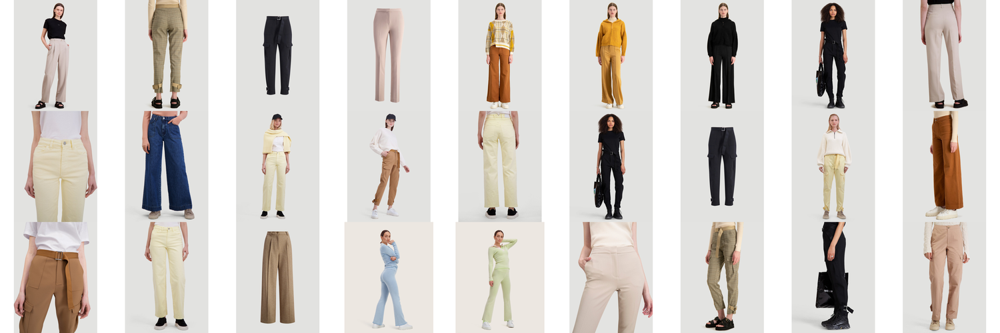

In [139]:
from fashion_clip.utils import display_images
from PIL import Image

LOCAL_PICTURES = "/home/kaborg15/FREja/Datasets/pictures/"

def display_cluster(subset_df):
    image_paths = [os.path.join(LOCAL_PICTURES, x) for x in subset_df["id"]]
    collage = display_images(image_paths, columns=9, max_images=27, plot_figure=False)
    collage.thumbnail((1500, 800), Image.ANTIALIAS)
    display(collage)

cardigans_subset = embeddings_df[embeddings_df["category"] == "Trousers"].copy()
cardigans_embeddings = np.stack(cardigans_subset["image_embedding"].values)
kmeans = KMeans(n_clusters=4, random_state=0).fit(cardigans_embeddings)
cardigans_subset["cluster"] = kmeans.labels_
for cluster in cardigans_subset["cluster"].value_counts().index:
    cluster_sum = np.abs(cardigans_embeddings[cardigans_subset["cluster"] == cluster].sum(axis=0))
    print(f"Cluster {cluster}, sum: {cluster_sum.mean()}")
    display_cluster(cardigans_subset[cardigans_subset["cluster"] == cluster])

In [140]:
categories_df = embeddings_df.value_counts("category").reset_index()
categories_df = categories_df[categories_df["count"] > 100]
categories_df

,category,count
0,Dresses,13193
1,Knitwear,2606
2,Tops,2206
3,Trousers,2014
4,Skirts,2005
5,Jackets,1388
6,Blouses,1145
7,Blazers,1098
8,Shirts,1089
9,Coats,1042


Finished category Dresses, sil_scores: [0.06284388, 0.059584837, 0.052437603]


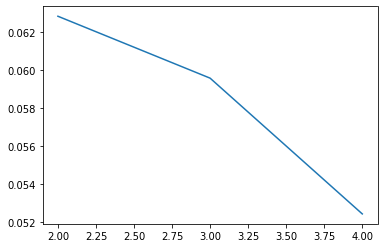

Finished category Knitwear, sil_scores: [0.055271316, 0.054201387, 0.060393035]


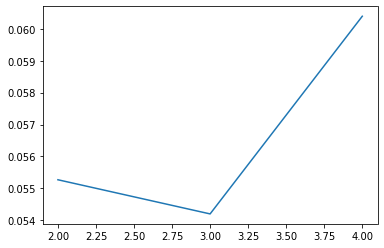

Finished category Tops, sil_scores: [0.04733421, 0.0547485, 0.05571693]


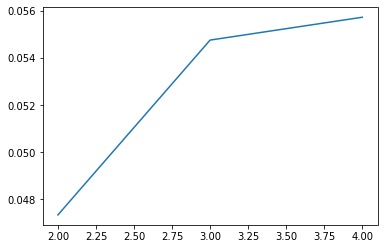

Finished category Trousers, sil_scores: [0.074419975, 0.06368025, 0.074060455]


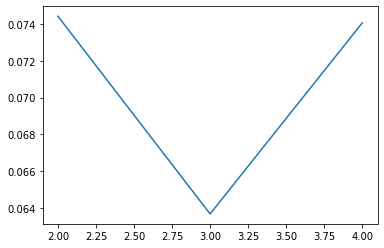

Finished category Skirts, sil_scores: [0.06920397, 0.064605035, 0.063682236]


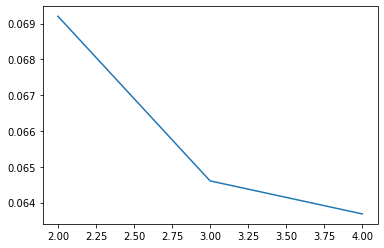

Finished category Jackets, sil_scores: [0.07358269, 0.05930399, 0.06173493]


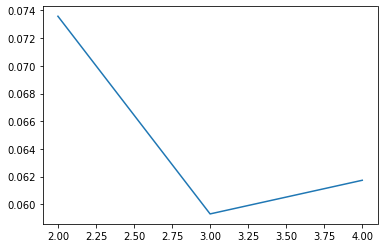

Finished category Blouses, sil_scores: [0.0547883, 0.05365096, 0.06143876]


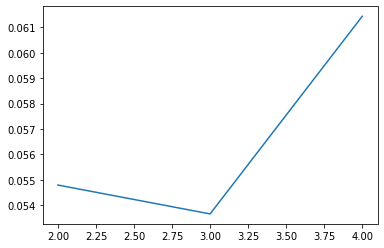

Finished category Blazers, sil_scores: [0.06347324, 0.069236085, 0.080620915]


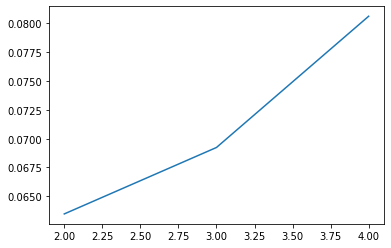

Finished category Shirts, sil_scores: [0.0768631, 0.05373528, 0.06315819]


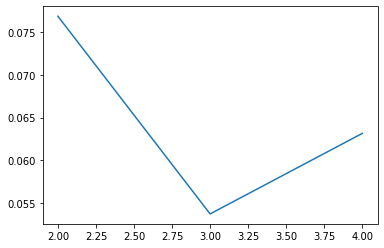

Finished category Coats, sil_scores: [0.076613255, 0.060817886, 0.0664299]


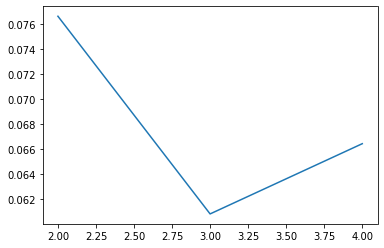

Finished category Bags, sil_scores: [0.06570508, 0.06811265, 0.06952076]


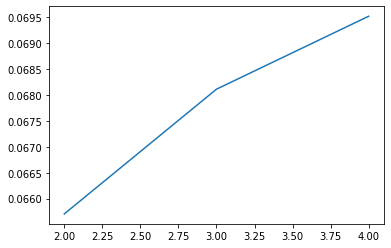

Finished category Jumpsuits, sil_scores: [0.13334501, 0.14357989, 0.15582004]


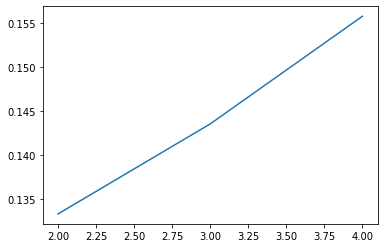

Finished category Sweaters, sil_scores: [0.06500203, 0.04958062, 0.068195306]


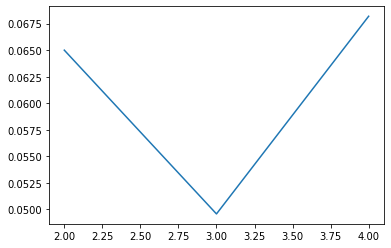

Finished category Jewelry, sil_scores: [0.09773324, 0.108378105, 0.109900765]


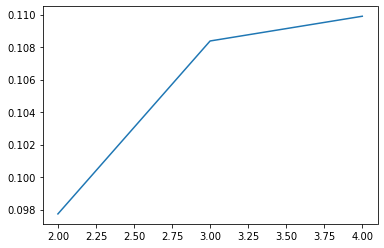

Finished category Accessories, sil_scores: [0.14337002, 0.14215244, 0.14483815]


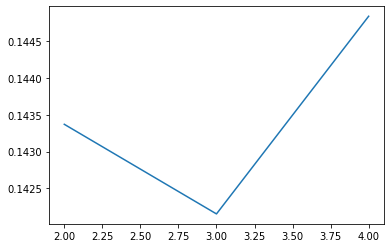

Finished category Shorts, sil_scores: [0.113529146, 0.14013813, 0.15419243]


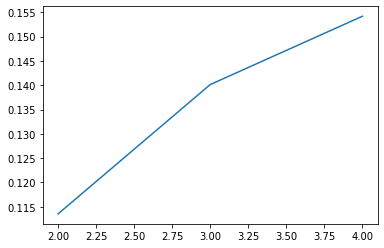

Finished category Cardigans, sil_scores: [0.09749519, 0.104951866, 0.13684316]


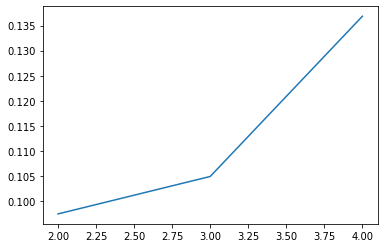

Finished category Shoes, sil_scores: [0.24475257, 0.23835678, 0.24938774]


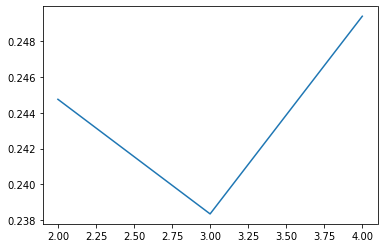

In [141]:
KMEANS_RANGE = range(2, 5)

def calculate_optimal_k_for_category(categories_df, df):
    categories = categories_df["category"].values
    optimal_k = {}
    for category in categories:
        category_subset = df[df["category"] == category].copy()
        category_embeddings = np.stack(category_subset["image_embedding"])
        sil_scores = []
        for k_means_value in KMEANS_RANGE:
            sil_score = get_silhouette_score(category_embeddings, k_means_value)
            sil_scores.append(sil_score)
        optimal_k[category] = sil_scores
        print(f"Finished category {category}, sil_scores: {sil_scores}")
        plt.plot(KMEANS_RANGE, sil_scores)
        plt.show()
    return optimal_k

optimal_k = calculate_optimal_k_for_category(categories_df, embeddings_df)
categories_df["optimal_k"] = categories_df["category"].apply(lambda x: optimal_k[x])

In [142]:
def choose_k_value(k_values, category_count):
    penalty_scalar = 0.01 if category_count > 1300 else 0.01
    penalties = np.log(np.array(KMEANS_RANGE)) * penalty_scalar
    adjusted_values = k_values - penalties
    k_range = np.array(KMEANS_RANGE)
    return k_range[np.argmax(adjusted_values)]

#categories_df["chosen_k"] = categories_df["optimal_k"].apply(lambda x: choose_k_value(np.array(x)))
categories_df["chosen_k"] = categories_df.apply(lambda row: choose_k_value(np.array(row["optimal_k"]), row["count"]), axis=1)
categories_df

,category,count,optimal_k,chosen_k
0,Dresses,13193,"[0.06284388, 0.059584837, 0.052437603]",2
1,Knitwear,2606,"[0.055271316, 0.054201387, 0.060393035]",2
2,Tops,2206,"[0.04733421, 0.0547485, 0.05571693]",3
3,Trousers,2014,"[0.074419975, 0.06368025, 0.074060455]",2
4,Skirts,2005,"[0.06920397, 0.064605035, 0.063682236]",2
5,Jackets,1388,"[0.07358269, 0.05930399, 0.06173493]",2
6,Blouses,1145,"[0.0547883, 0.05365096, 0.06143876]",2
7,Blazers,1098,"[0.06347324, 0.069236085, 0.080620915]",4
8,Shirts,1089,"[0.0768631, 0.05373528, 0.06315819]",2
9,Coats,1042,"[0.076613255, 0.060817886, 0.0664299]",2


In [143]:
CATEGORIES_DF_PATH = "Pickled_Data/categories_df.pkl"
categories_df.to_pickle(CATEGORIES_DF_PATH)

Showing 27 images of 9171:


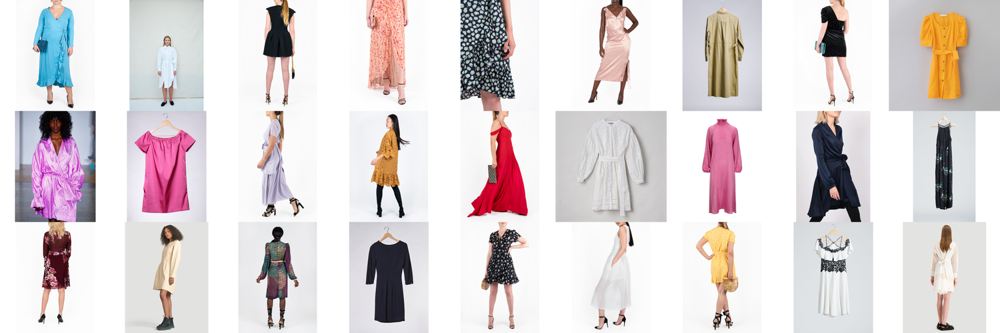

Showing 27 images of 4022:


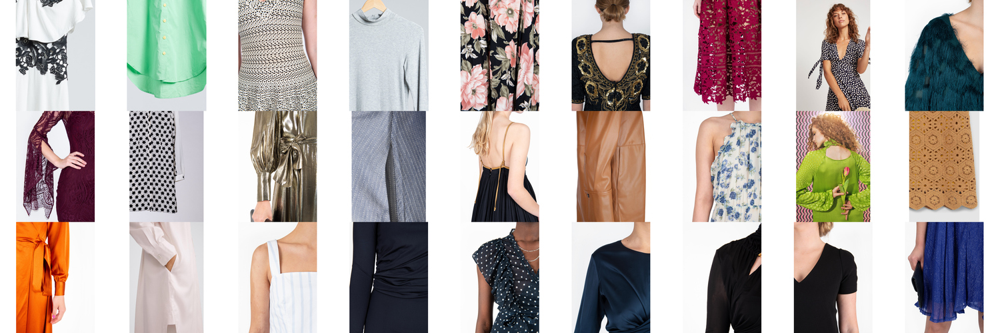

In [144]:
def display_category_clusters(category, categories_df, embeddings_df):
    category_subset = embeddings_df[embeddings_df["category"] == category].copy()
    n_clusters = categories_df[categories_df["category"] == category]["chosen_k"].values[0]
    data = np.stack(category_subset["image_embedding"])
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=0).fit(data)
    category_subset["cluster"] = kmeans.labels_
    for cluster in category_subset["cluster"].value_counts().index:
        display_cluster(category_subset[category_subset["cluster"] == cluster])

display_category_clusters("Dresses", categories_df, embeddings_df)

In [145]:
def calculate_mean_cluster_embeddings(categories_df, embeddings_df, category):
    category_subset = embeddings_df[embeddings_df["category"] == category].copy()
    n_clusters = categories_df[categories_df["category"] == category]["chosen_k"].values[0]
    data = np.stack(category_subset["image_embedding"])
    kmeans = KMeans(n_clusters=n_clusters, init="k-means++", random_state=0).fit(data)
    category_subset["cluster"] = kmeans.labels_
    cluster_embeddings = []
    for cluster in category_subset["cluster"].value_counts().index:
        embedding = np.stack(category_subset[category_subset["cluster"] == cluster]["image_embedding"])
        mean_embedding = embedding.mean(axis=0)
        cluster_embeddings.append(mean_embedding)
    print(f"{category}: cluster sums: {[np.abs(x).sum() for x in cluster_embeddings]}")
    return np.stack(cluster_embeddings)


categories_df["mean_embeddings"] = categories_df["category"].apply(lambda x : calculate_mean_cluster_embeddings(categories_df, embeddings_df, x))


Dresses: cluster sums: [10.765985, 9.978933]
Knitwear: cluster sums: [10.526559, 10.308166]
Tops: cluster sums: [9.673964, 9.870409, 10.553141]
Trousers: cluster sums: [10.314407, 11.157038]
Skirts: cluster sums: [9.896336, 10.914167]
Jackets: cluster sums: [9.611435, 11.268156]
Blouses: cluster sums: [10.052505, 10.859308]
Blazers: cluster sums: [11.211872, 11.106845, 10.713089, 13.061641]
Shirts: cluster sums: [10.399804, 10.137223]
Coats: cluster sums: [10.757427, 9.568469]
Bags: cluster sums: [9.573999, 10.7351465]
Jumpsuits: cluster sums: [11.82142, 14.750938, 11.642508, 10.604345]
Sweaters: cluster sums: [10.361784, 10.166811]
Jewelry: cluster sums: [10.015763, 9.844358, 10.096924]
Accessories: cluster sums: [8.145065, 11.603968]
Shorts: cluster sums: [12.298064, 11.697831, 11.687008, 13.900182]
Cardigans: cluster sums: [10.935915, 11.878052, 10.669045, 15.529642]
Shoes: cluster sums: [14.244553, 11.966318]


In [146]:
from sklearn.metrics.pairwise import cosine_similarity

clusters_dict = {}
for index, row in categories_df.iterrows():
    category = row["category"]
    for i, embedding in enumerate(row["mean_embeddings"]):
        clusters_dict[f"{category}_{i}"] = embedding

def find_most_apt_cluster(embedding, clusters_dict):
    similarities = {}
    for cluster_name, cluster_embedding in clusters_dict.items():
        similarity = cosine_similarity(embedding.reshape(1, -1), cluster_embedding.reshape(1,-1))[0][0]
        similarities[cluster_name] = similarity
    max_category = max(similarities, key=similarities.get)
    return (max_category, similarities[max_category])

embeddings_df["most_apt_cluster"] = embeddings_df["image_embedding"].apply(lambda x: find_most_apt_cluster(x, clusters_dict))
embeddings_df.head(10)

,id,owner,image_embedding,text_embedding,name,description,outfit_tags,tag_categories,Outfit_size,tag_encoding,description,hash,material,category,most_apt_cluster
0,picture.0000cdba64314d84a49ed1c266589cc0,outfit.794483397da8425a813301eecf9828c6,"[-0.024287453, 0.03701493, -0.02844217, 0.0927...","[-0.05313541, 0.025319584, -0.018410295, 0.086...",Limon Wrap Niagara Dress,This midi length dress with an adjustable wais...,"[Viscose, Multi Season, Midi, Everyday, Samsøe...","[Material, Seasons, Length, Occasion, Brand, F...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",This midi length dress with an adjustable wais...,4407879948980236932,Viscose,Dresses,"(Dresses_0, 0.7818134)"
1,picture.00058abb53434872ae9bb4270ae21f8e,outfit.98f32aaf08bc4ff09c44e6e11e9199bc,"[-0.0040395684, 0.1221746, -0.049363144, 0.022...","[-0.002178842, 0.016401345, -0.06984836, 0.065...",Kim Bright White Dress,The KIM is an oversized menswear inspired shir...,"[Cotton, Midi, Everyday, Dresses, XS, Summer, ...","[Material, Length, Occasion, Category, Size, S...",[XS],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The KIM is an oversized menswear inspired shir...,-2476823619172038015,Cotton,Dresses,"(Shirts_0, 0.7643794)"
2,picture.00063f52c36d43ada95da45f819b30b4,outfit.9fd1c42c3db543c5b6e53b0db1ee8c0f,"[-0.0127086695, 0.0592464, -0.05856385, -0.006...","[0.0011028233, 0.01954076, 0.016044276, -0.035...",Lace Dress,The Lace Dress from Karen Millen is a elegante...,"[Dressed-up, Synthetic, Midi, Everyday, M, Dre...","[Occasion, Material, Length, Occasion, Size, C...",[M],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The Lace Dress from Karen Millen is a elegante...,4858025489500907374,Synthetic,Dresses,"(Dresses_1, 0.8068523)"
3,picture.0008443461814f5c988f123718bbd20e,outfit.a7539783b6e94591bdf4e10339afc1d7,"[-0.017948486, 0.059368093, -0.10794367, 0.075...","[0.0003785785, 0.034153514, 0.033039812, 0.048...",Oversize Shirt Dress Green,A long shirt with collar in organic crispy cot...,"[Høst & Vår, Cotton, Multi Season, Everyday, D...","[Brand, Material, Seasons, Occasion, Category,...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",A long shirt with collar in organic crispy cot...,-3642115099381605296,Cotton,Dresses,"(Shirts_0, 0.7831382)"
4,picture.000cf715019a4a02aaf0dc479212195a,outfit.f11bdc25d87946f8b831b608bc8fb574,"[0.016645785, 0.07629911, 0.003135107, 0.06165...","[-0.004993015, 0.029407833, 0.034829285, 0.112...",Conscious Blouse,The Conscious Blouse from Filippa K is a silk ...,"[Silk, Blouses, Everyday, Summer, Filippa K, S...","[Material, Category, Occasion, Seasons, Brand,...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The Conscious Blouse from Filippa K is a silk ...,-8851840971059608749,Silk,Blouses,"(Blouses_0, 0.8072586)"
5,picture.000ddec26b7a4aa495e2d7db9e9585e9,outfit.40d4e8f739a74e488769b16f8f87ca83,"[0.0030080841, -0.14907463, -0.052055396, -0.0...","[-0.05420202, -0.023125168, 0.02284297, -0.013...",Oldina Parka WGrey,The Oldina Parka from Kari Traa is a women's p...,"[Winter, Synthetic, L, Midi, Everyday, Coats, ...","[Seasons, Material, Size, Length, Occasion, Ca...",[L],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The Oldina Parka from Kari Traa is a women's p...,-109563257534290970,Synthetic,Coats,"(Coats_1, 0.81104636)"
6,picture.0010c2e161154d6893734981d5455e76,outfit.9387d05b47f906c5,"[0.012010854, 0.010716578, 0.017488718, -0.000...","[0.020559106, 0.03564133, -0.024204658, -0.013...",Neo Dress,Perfect for summer weddings and also just summ...,"[Synthetic, Cotton, Hunkydory, Viscose, L, Eve...","[Material, Material, Brand, Material, Size, Oc...",[L],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",Perfect for summer weddings and also just summ...,-3574596186686597984,Synthetic,Dresses,"(Skirts_1, 0.7731893)"
7,picture.0013342f663843d4b7397b4b88b98e6d,outfit.b24fc57f02ac4e4c9061761ca18d9d3c,"[-0.05683771, -0.042248454, -0.0451742, 0.0289...","[-0.030160492, -0.028460637, -

In [147]:
def subtract_cluster_from_embedding(embedding, cluster_name, clusters_dict):
    cluster_embedding = clusters_dict[cluster_name]
    return embedding - cluster_embedding

embeddings_df["style_vector"] = embeddings_df.apply(lambda x: subtract_cluster_from_embedding(x["image_embedding"], x["most_apt_cluster"][0], clusters_dict), axis=1)

In [148]:
embeddings_df.head(2)

,id,owner,image_embedding,text_embedding,name,description,outfit_tags,tag_categories,Outfit_size,tag_encoding,description,hash,material,category,most_apt_cluster,style_vector
0,picture.0000cdba64314d84a49ed1c266589cc0,outfit.794483397da8425a813301eecf9828c6,"[-0.024287453, 0.03701493, -0.02844217, 0.0927...","[-0.05313541, 0.025319584, -0.018410295, 0.086...",Limon Wrap Niagara Dress,This midi length dress with an adjustable wais...,"[Viscose, Multi Season, Midi, Everyday, Samsøe...","[Material, Seasons, Length, Occasion, Brand, F...",[S],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",This midi length dress with an adjustable wais...,4407879948980236932,Viscose,Dresses,"(Dresses_0, 0.7818134)","[-0.015674591, -0.029823251, -0.04055707, 0.09..."
1,picture.00058abb53434872ae9bb4270ae21f8e,outfit.98f32aaf08bc4ff09c44e6e11e9199bc,"[-0.0040395684, 0.1221746, -0.049363144, 0.022...","[-0.002178842, 0.016401345, -0.06984836, 0.065...",Kim Bright White Dress,The KIM is an oversized menswear inspired shir...,"[Cotton, Midi, Everyday, Dresses, XS, Summer, ...","[Material, Length, Occasion, Category, Size, S...",[XS],"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",The KIM is an oversized menswear inspired shir...,-2476823619172038015,Cotton,Dresses,"(Shirts_0, 0.7643794)","[0.005621935, 0.0725104, -0.022498304, 0.01656..."


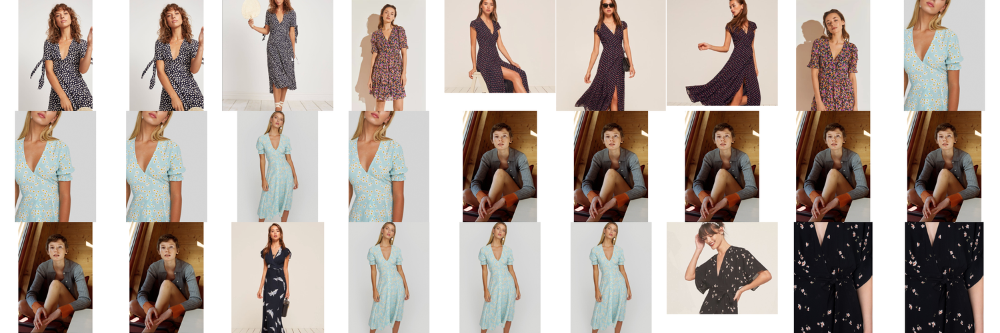

In [150]:
from sklearn.neighbors import NearestNeighbors

#INDEX = 2590
INDEX = 43

embeddings_df.dropna(subset="category", inplace=True)
subtracted_embeddings = np.stack(embeddings_df["style_vector"])
nbrs = NearestNeighbors(n_neighbors=26, algorithm='ball_tree').fit(subtracted_embeddings)
distances, indices = nbrs.kneighbors(embeddings_df["style_vector"].values[INDEX].reshape(1, -1))
display_cluster(embeddings_df.iloc[np.append(INDEX, indices[0])])

In [163]:
from sklearn.neighbors import NearestNeighbors

print(len(embeddings_df))
single_embeddings_df = embeddings_df.groupby("owner").head(1)
print(len(single_embeddings_df))
single_embeddings_df = single_embeddings_df.groupby("hash").head(1)
print(len(single_embeddings_df))

subtracted_embeddings = np.stack(single_embeddings_df["style_vector"])
nbrs = NearestNeighbors(n_neighbors=26, algorithm='ball_tree').fit(subtracted_embeddings)


31302
9457
7360


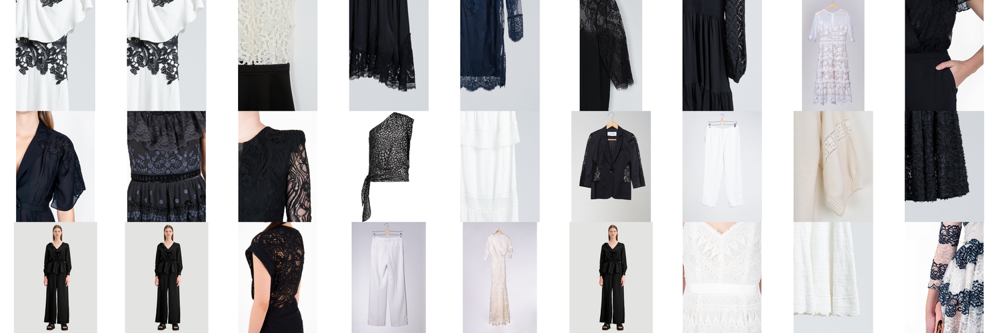

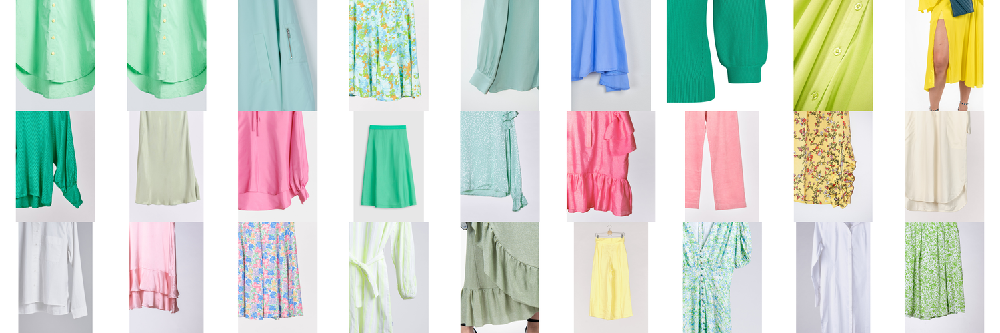

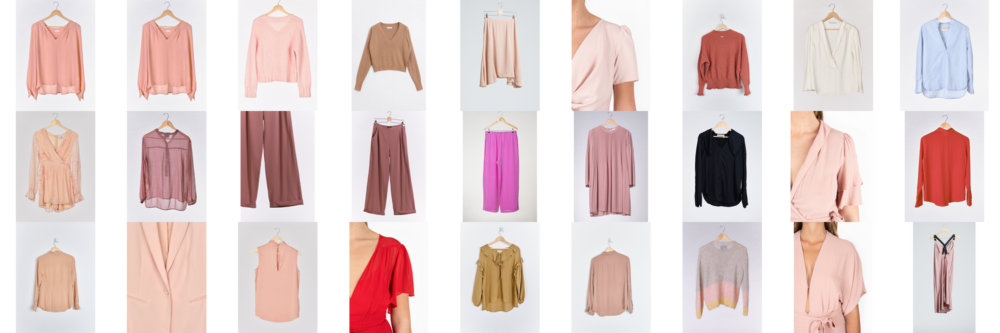

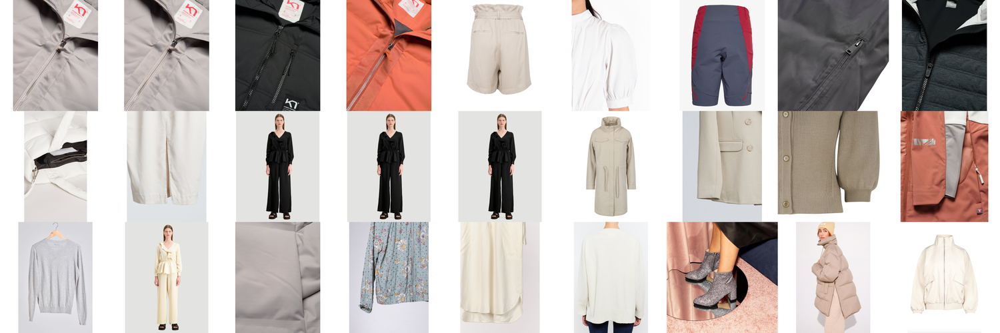

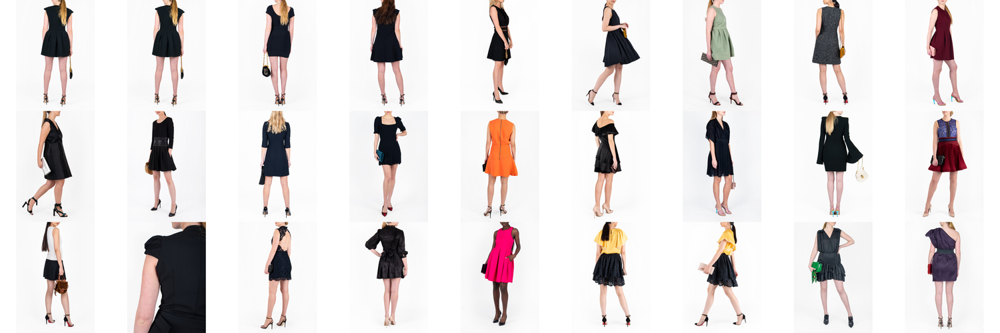

In [165]:
INDEX = 2

for i in range(INDEX, INDEX + 5):
    distances, indices = nbrs.kneighbors(single_embeddings_df["style_vector"].values[i].reshape(1, -1))
    display_cluster(single_embeddings_df.iloc[np.append(i, indices[0])])

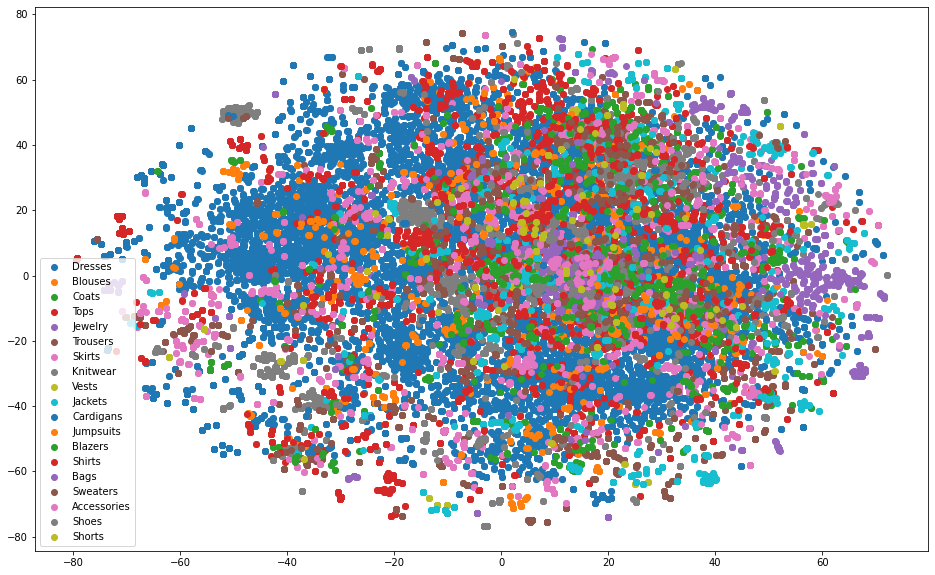

In [87]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

tsne = TSNE(n_components=2, random_state=0, perplexity=50, early_exaggeration=24)
tsne_data = tsne.fit_transform(np.stack(embeddings_df["style_vector"]))
embeddings_df["tsne_x"] = tsne_data[:, 0]
embeddings_df["tsne_y"] = tsne_data[:, 1]

plt.figure(figsize=(16, 10))
for category in embeddings_df["category"].unique():
    category_df = embeddings_df[embeddings_df["category"] == category]
    plt.scatter(category_df["tsne_x"], category_df["tsne_y"], label=category)

plt.legend()
plt.show()

In [88]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.preprocessing import StandardScaler

# Assuming embeddings_df is already defined and contains your data.
X = np.stack(embeddings_df["style_vector"])

# Compute RBF kernel matrix
gamma = 1.0  # You might need to tune this parameter
K = rbf_kernel(X, gamma=gamma)

# It's usually a good idea to standardize your data before dimensionality reduction
scaler = StandardScaler()
K_scaled = scaler.fit_transform(K)

# Applying t-SNE on the RBF kernel matrix
tsne = TSNE(n_components=2, random_state=0, perplexity=50, early_exaggeration=24)
tsne_data = tsne.fit_transform(K_scaled)

embeddings_df["tsne_x"] = tsne_data[:, 0]
embeddings_df["tsne_y"] = tsne_data[:, 1]


plt.figure(figsize=(16, 10))
for category in embeddings_df["category"].unique()[:10]:
    category_df = embeddings_df[embeddings_df["category"] == category]
    plt.scatter(category_df["tsne_x"], category_df["tsne_y"], label=category)

plt.legend()
plt.show()


In [90]:
import numpy as np
from sklearn.metrics.pairwise import rbf_kernel
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt

# Assuming embeddings_df is already defined and contains your data.
X = np.stack(embeddings_df["style_vector"])

# Compute RBF kernel matrix
gamma = 1.0  # You might need to tune this parameter
K = rbf_kernel(X, gamma=gamma)

# Standardize kernel matrix
# scaler = StandardScaler()
# K_scaled = scaler.fit_transform(K)
K_scaled = K

# Apply DBSCAN on the RBF kernel matrix
dbscan = DBSCAN(eps=0.5, min_samples=5, metric='precomputed')
clusters = dbscan.fit_predict(1 - K_scaled)  # 1 minus K to convert similarity to distance

# Adding cluster info to your dataframe
embeddings_df["cluster"] = clusters



In [92]:

from sklearn.cluster import DBSCAN

dbscan_results = []
for eps in np.arange(0.28, 0.5, 0.05):
    dbscan = DBSCAN(eps=eps, min_samples=5, metric='precomputed')
    clusters = dbscan.fit_predict(1 - K_scaled)  # 1 minus K to convert similarity to distance
    dbscan_labels = dbscan.labels_
    results = np.unique(dbscan_labels, return_counts=True)
    dbscan_results.append(results)
    print(f"eps: {eps}, results: {results}")

eps: 0.28, results: (array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
       129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
       142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
       155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
       168, 169, 170, 171, 172, 173, 174, 1

In [93]:
from sklearn.cluster import DBSCAN

dbscan_results = []
for eps in np.arange(0.48, 0.6, 0.05):
    dbscan = DBSCAN(eps=eps, min_samples=10).fit(subtracted_embeddings)
    dbscan_labels = dbscan.labels_
    results = np.unique(dbscan_labels, return_counts=True)
    dbscan_results.append(results)
    print(f"eps: {eps}, results: {results}")

eps: 0.48, results: (array([ -1,   0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,
        12,  13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,
        25,  26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,
        38,  39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,
        51,  52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,
        64,  65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,
        77,  78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,
        90,  91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102,
       103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115,
       116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128,
       129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141,
       142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154,
       155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167,
       168, 169, 170, 171, 172, 173, 174, 1

In [94]:
dbscan = DBSCAN(eps=0.52, min_samples=10).fit(subtracted_embeddings)
dbscan_labels = dbscan.labels_

Showing 27 images of 21906:


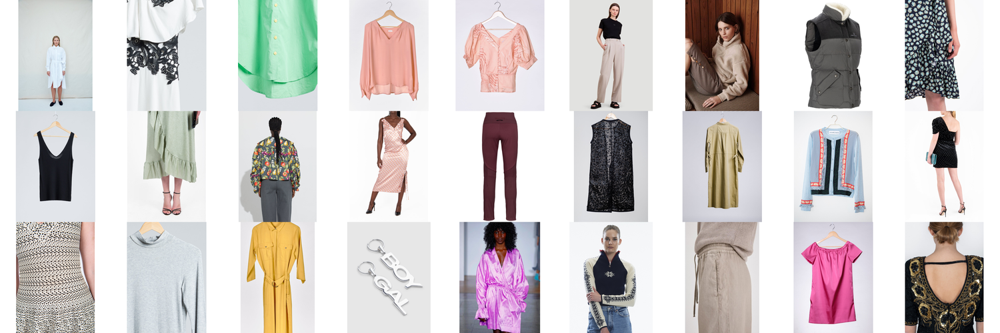

Showing 27 images of 38:


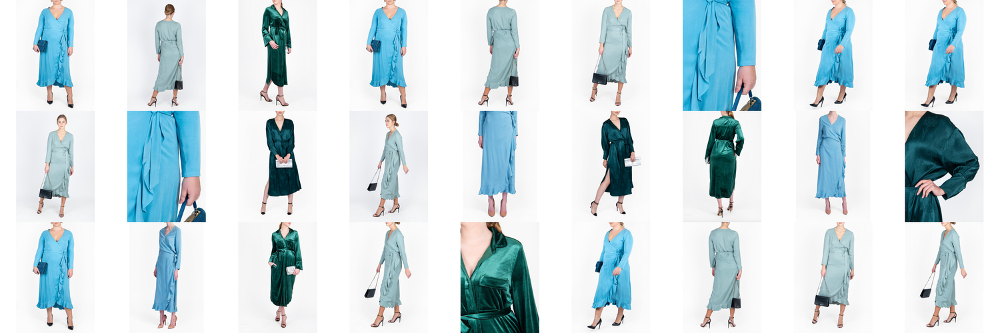

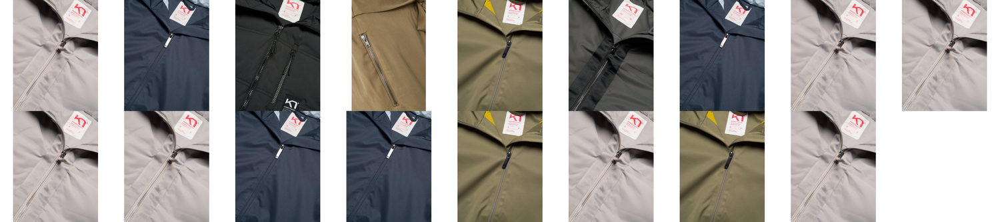

Showing 27 images of 5062:


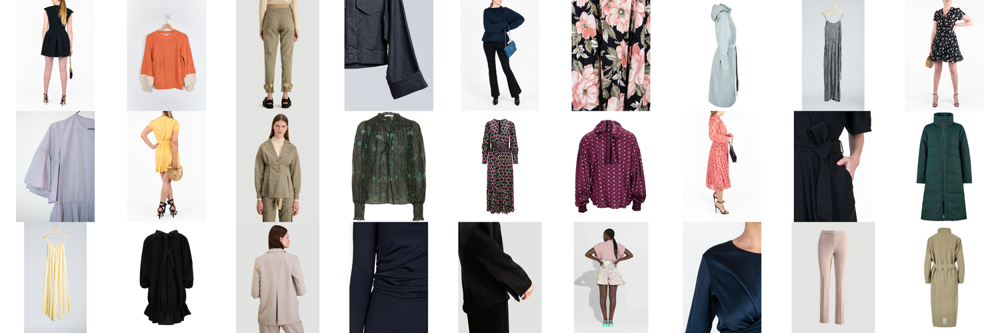

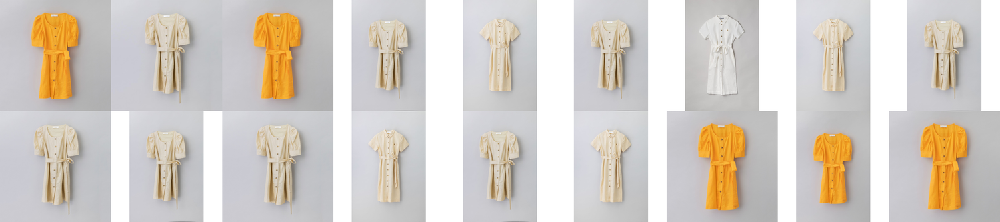

Showing 27 images of 28:


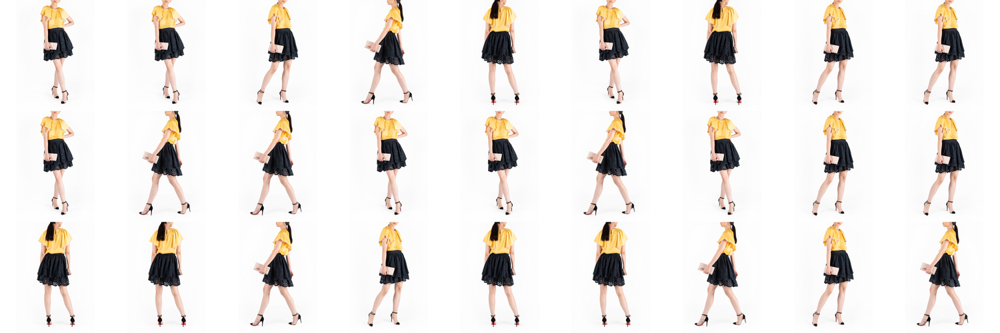

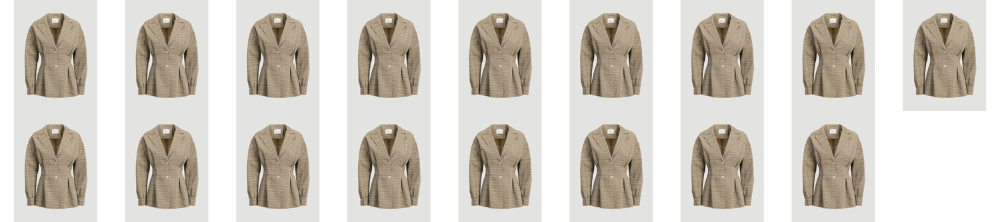

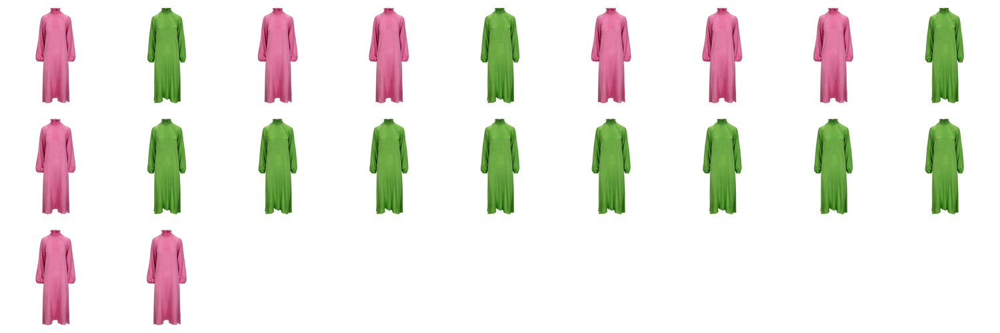

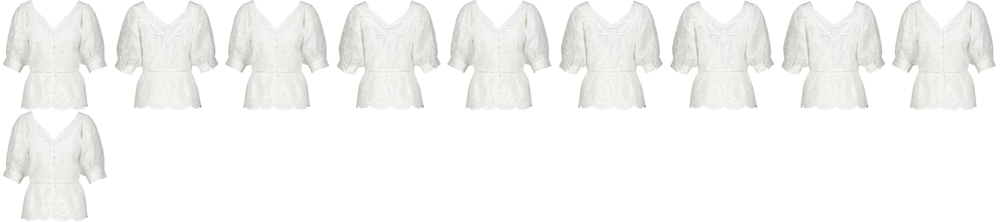

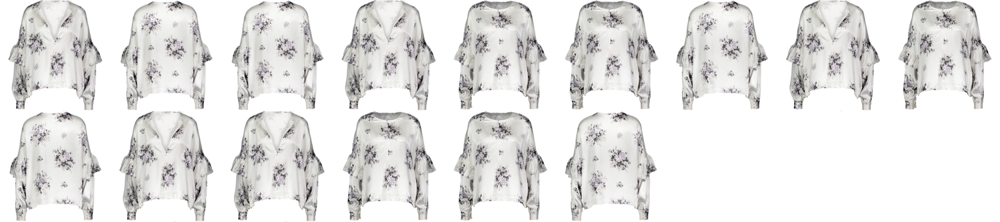

Showing 27 images of 51:


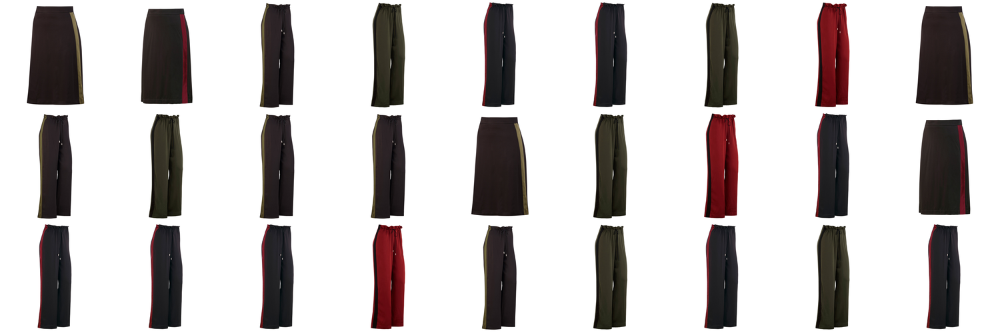

In [95]:
embeddings_df["dbscan_labels"] = dbscan_labels
for i in range(-1, 10):
    display_cluster(embeddings_df[embeddings_df["dbscan_labels"] == i])

## User testing from here on out

In [108]:
import pandas as pd

def split_input_label(outfit_ids, embeddings_df):
    # label id must be a part of the embeddings_df owner column
    reversed_outfit_ids = outfit_ids[::-1]
    for i, outfit_id in enumerate(reversed_outfit_ids):
        if outfit_id in embeddings_df["owner"].values:
            reversed_outfit_ids = np.delete(reversed_outfit_ids, i)
            return reversed_outfit_ids[::-1], outfit_id
    print("None of user's outfits are in the live database.")
    return outfit_ids[:-1], outfit_ids[-1]

# Removes outfits that are not among the embeddings, removes about 6 of them.
existing_outfits_orders = orders_df[orders_df["outfit.id"].isin(embeddings_df["owner"])]

user_backlogs = pd.DataFrame(existing_outfits_orders.groupby("customer.id")["outfit.id"].apply(list)).reset_index()
user_backlogs["backlog_length"] = user_backlogs["outfit.id"].apply(lambda x: len(x))
user_backlogs["unique_outfits"] = user_backlogs["outfit.id"].apply(lambda x: len(set(x)))
user_backlogs = user_backlogs[user_backlogs["backlog_length"] > 5]
user_validation_data = user_backlogs.copy()
user_validation_data["input_outfits"], user_validation_data["label_outfit"] = zip(*user_validation_data["outfit.id"].apply(lambda x: split_input_label(x, embeddings_df)))
#user_validation_data.drop(columns=["outfit.id"], inplace=True)
user_validation_data.rename(columns={"outfit.id": "backlog"}, inplace=True)
user_validation_data

,customer.id,backlog,backlog_length,unique_outfits,input_outfits,label_outfit
0,user.0002cc107c3743edafbe60d16b715a55,"[outfit.9f7434145481442191419433bd1aa953, outf...",19,19,"[outfit.9f7434145481442191419433bd1aa953, outf...",outfit.3d315786a48541219d62027750941507
1,user.006753f5f62e4fdab069526e611ef487,"[outfit.1dcf89de27284ebe9851d5fcd42e9fa1, outf...",42,42,"[outfit.1dcf89de27284ebe9851d5fcd42e9fa1, outf...",outfit.df36aeab8ee742388c43c6b8f832f4be
2,user.00a6b9163bbe4f0d962a7f3a277dc148,"[outfit.78272e5994da4658ac56ede658533a78, outf...",9,9,"[outfit.78272e5994da4658ac56ede658533a78, outf...",outfit.54006e2da4dc4c0195af9858f7288df2
3,user.00b8fed52c8141af9bc06ecc454c42d7,"[outfit.ef1d5562f0b64f8ebef2f04c475d398e, outf...",7,7,"[outfit.ef1d5562f0b64f8ebef2f04c475d398e, outf...",outfit.ae538ccb6bf14a858b0f66458e592872
4,user.00be36a4fbb5473aa9a17291d634d5d4,"[outfit.269136713d7d4d58afd15f74be35207d, outf...",36,36,"[outfit.269136713d7d4d58afd15f74be35207d, outf...",outfit.c47ac45c182049df8636c0e8572076c1
...,...,...,...,...,...,...
2077,user.fe5e0c1a83f648999813db07aa536560,"[outfit.371b56b65f984af98d7233c31e7ffbad, outf...",53,50,"[outfit.371b56b65f984af98d7233c31e7ffbad, outf...",outfit.26610c21ae3e4a238a7ab62f557808ed
2079,user.ff30ff0d1f714cfdac66b2b928ec6620,"[outfit.a10a840b542d45dc8f2d9ff6f08372c7, outf...",47,42,"[outfit.a10a840b542d45dc8f2d9ff6f08372c7, outf...",outfit.28256fea7e9a477ebc136d3aa40861d9
2080,user.ff8726416ac042239adc1a5f3d53ccc1,"[outfit.588d78c7613f4e10b418317946a7a186, outf...",9,9,"[outfit.588d78c7613f4e10b418317946a7a186, outf...",outfit.a8544eb2962547d1bb80da530b4c377a
2081,user.ff9cade97c4f4dfe86c5fa9b748c32a2,"[outfit.ba04d6dde7474f02a3541fa4ca370d65, outf...",18,18,"[outfit.ba04d6dde7474f02a3541fa4ca370d65, outf...",outfit.d968d57e3a3e4c42b75d5acb712cdd42


In [109]:
DEFAULT_VECTOR = np.zeros(embeddings_df["tag_encoding"].iloc[0].shape, dtype=np.int32)

def construct_user_tag_representation(user_input_items, image_embeddings_dict):
    user_representation = [image_embeddings_dict[outfit] for outfit in user_input_items]    
    return np.stack(user_representation)
        
#Calculate image embedding representation for each outfit and apply it per user.
mean_outfit_embeddings = pd.DataFrame(embeddings_df.groupby("owner")["image_embedding"].apply(np.mean)).reset_index()
image_embeddings_dict = mean_outfit_embeddings.set_index("owner").to_dict()["image_embedding"]
mean_style_vector = pd.DataFrame(embeddings_df.groupby("owner")["style_vector"].apply(np.mean)).reset_index()
style_vector_dict = mean_style_vector.set_index("owner").to_dict()["style_vector"]
user_validation_data["image_embeddings"] = user_validation_data["backlog"].apply(lambda x: construct_user_tag_representation(x, image_embeddings_dict))
user_validation_data["style_vectors"] = user_validation_data["backlog"].apply(lambda x: construct_user_tag_representation(x, style_vector_dict))

In [114]:
from sklearn.metrics import silhouette_score
silhouette_df = user_validation_data.sort_values(by=["backlog_length"], ascending=False)
silhouette_df = silhouette_df[["customer.id", "image_embeddings", "style_vectors"]].explode(column=["image_embeddings", "style_vectors"])
silhouette_df.head(2)

,customer.id,image_embeddings,style_vectors
578,user.4c839caa8a9f4132b7cec64cc36b034e,"[-0.029355198, 0.06066797, -0.011401451, 0.034...","[-0.024633955, 0.006481152, 0.004743241, 0.022..."
578,user.4c839caa8a9f4132b7cec64cc36b034e,"[-0.026518935, 0.0813606, 0.03222819, -0.03314...","[-0.017820748, 0.010197273, 0.029166147, -0.02..."


In [122]:

style_embeddings, img_embeddings, labels = np.stack(silhouette_df[["style_vectors"]].values.squeeze()), np.stack(silhouette_df[["image_embeddings"]].values.squeeze()), np.stack(silhouette_df["customer.id"].values)
img_sil_score = silhouette_score(img_embeddings, labels)
style_sil_score = silhouette_score(style_embeddings, labels)
print(f"Silhouette score for image embeddings: {img_sil_score}, style embeddings: {style_sil_score}")

Silhouette score for image embeddings: -0.16696888208389282, style embeddings: -0.14820845425128937


In [129]:
from sklearn.metrics import pairwise_distances

pairwise_results = []
for index, row in silhouette_df.groupby("customer.id")[["image_embeddings"]]:
    row_embeddings = np.stack(row["image_embeddings"].values)
    cosine_distances = pairwise_distances(row_embeddings, metric="euclidean")
    distances_results = np.array((cosine_distances.shape[0], cosine_distances.std(), cosine_distances.max(), cosine_distances.mean()))
    pairwise_results.append(distances_results)

pairwise_results = np.stack(pairwise_results)
print(f"Standard deviation: {pairwise_results[:,1].mean(axis=0)} Max distance: {pairwise_results[:,2].mean(axis=0)} Mean distance: {pairwise_results[:,3].mean(axis=0)}")

Standard deviation: 0.13061013069665128 Max distance: 0.6187191547556558 Mean distance: 0.3754640315864248


In [128]:
from sklearn.metrics import pairwise_distances

pairwise_results = []
for index, row in silhouette_df.groupby("customer.id")[["style_vectors"]]:
    row_embeddings = np.stack(row["style_vectors"].values)
    cosine_distances = pairwise_distances(row_embeddings, metric="euclidean")
    distances_results = np.array((cosine_distances.shape[0], cosine_distances.std(), cosine_distances.max(), cosine_distances.mean()))
    pairwise_results.append(distances_results)

pairwise_results = np.stack(pairwise_results)
print(f"Standard deviation: {pairwise_results[:,1].mean(axis=0)} Max distance: {pairwise_results[:,2].mean(axis=0)} Mean distance: {pairwise_results[:,3].mean(axis=0)}")

Standard deviation: 0.264485743690877 Max distance: 1.269540806434349 Mean distance: 0.8988187508970356


In [131]:
distances_all_img_embeddings = pairwise_distances(img_embeddings, metric="cosine")
distances_all_style_embeddings = pairwise_distances(style_embeddings, metric="cosine")
print(f"Image embeddings (Max distance: {distances_all_img_embeddings.max()} Mean distance: {distances_all_img_embeddings.mean()})")
print(f"Style embeddings (Max distance: {distances_all_style_embeddings.max()} Mean distance: {distances_all_style_embeddings.mean()})")

NameError: name 'pairwise_distances' is not defined

In [130]:
embeddings_df.shape, pictures_df.shape

((21364, 14), (32103, 11))

In [138]:
def calculate_cluster_centroid(embeddings):
    return np.mean(embeddings, axis=0)

def calculate_intra_cluster_distance(embeddings):
    centroid = calculate_cluster_centroid(embeddings)
    distances = pairwise_distances(embeddings, centroid.reshape(1, -1), metric="manhattan")
    return distances.mean(), distances.var(), distances.std()

def calculate_user_cluster_distances(embeddings_df, column):
    results = []
    for index, row in silhouette_df.groupby("customer.id")[[column]]:
        row_embeddings = np.stack(row[column].values)
        distances_results = calculate_intra_cluster_distance(row_embeddings)
        results.append(distances_results)
    results = np.stack(results)
    print(f"{column}: mean:{results[:,0].mean().round(3)} var:{results[:,1].mean().round(3)} std:{results[:,2].mean().round(3)}")
    return results

#calculate_intra_cluster_distance(img_embeddings), calculate_intra_cluster_distance(style_embeddings)
image_intra_cluster_results = calculate_user_cluster_distances(silhouette_df, "image_embeddings")
style_intra_cluster_results = calculate_user_cluster_distances(silhouette_df, "style_vectors")

image_embeddings: mean:9.948 var:1.856 std:1.328
style_vectors: mean:8.675 var:1.634 std:1.247
